In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from preprocessing import merge_chembl_papyrus_mutants
from mutant_analysis_type import plot_bubble_aachange_distance,plot_stacked_bars_mutation_type
from mutant_analysis_family import obtain_chembl_family
from mutant_analysis_organism import annotate_organism_taxonomy

In [ ]:
annotation_round = 1

In [3]:
# Read mutant annotated ChEMBL + Papyrus data
annotated_data = merge_chembl_papyrus_mutants('31', '05.5', 'nostereo', 1_000_000, annotation_round)
annotated_data

,target_id,connectivity,pchembl_value_Mean,Activity_class_consensus,source,SMILES,CID,accession,sequence,Year,UniProtID,Organism,HGNC_symbol
0,A0A045ISB3_F161S,ALIJNJWQOZKBPP,5.07,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2)cc1,CHEMBL4637459,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN
1,A0A045ISB3_F161S,CXXIUJZSLPZZIM,5.27,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2Cl)cc1,CHEMBL4647367,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN
2,A0A045ISB3_F161S,IPTNWUSXZLVWFT,5.04,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2F)cc1,CHEMBL4638011,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN
3,A0A045ISB3_F161S,LUVQLVJTOZVLDB,5.13,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2Br)cc1,CHEMBL4637373,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN
4,A0A045ISB3_I203A,ALIJNJWQOZKBPP,7.37,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2)cc1,CHEMBL4637459,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
620016,Q9YQ12_WT,ZYLARFCKPNSSDA,6.17,"Series([], dtype: object)",ChEMBL31,CC(C)[C@H](NC(=O)COc1ccccc1)C(=O)N[C@@H](Cc1cc...,CHEMBL3331342,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2014.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN
620017,Q9YQ12_WT,ZYLFWZWRSRMGBQ,10.10,"Series([], dtype: object)",ChEMBL31,Nc1cccc(CN2C(=O)N(Cc3ccc4cn[nH]c4c3)C(Cc3ccccc...,CHEMBL2296983,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2013.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN
620018,Q9YQ12_WT,ZZCUJLFFPCGLAL,5.51,"Series([], dtype: object)",ChEMBL31,CC1(C)CC[C@]2(C(=O)NCCCCCC(=O)NCC(=O)O)CC[C@]3...,CHEMBL4530451,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2019.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN
620019,Q9YQ12_WT,ZZGMOZUZSAJAML,6.26,"Series([], dtype: object)",ChEMBL31,CC(C)c1nc(CN(C(=O)N[C@H](C(=O)N[C@H](CC[C@H](C...,CHEMBL3115161,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2014.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN


In [4]:
# Get ChEMBL families to extract protein family accession codes
chembl_families = obtain_chembl_family(chembl_version='31').fillna('Other')
kinases_accession_list = chembl_families[chembl_families['l2']=='Kinase']['accession'].tolist()
gpcrs_accession_list = chembl_families[chembl_families['l2'].str.contains('G protein-coupled receptor')]['accession'].tolist()

In [5]:
# Annotate data for the taxonomical classification based on domain (i.e. Virus, Bacteria, Archaea, or Eukaryota)
annotated_data_tax = annotate_organism_taxonomy(annotated_data)
annotated_data_tax

Retrying in 3s
Fetched: 312 / 338


,target_id,connectivity,pchembl_value_Mean,Activity_class_consensus,source,SMILES,CID,accession,sequence,Year,UniProtID,Organism,HGNC_symbol,classification
0,A0A045ISB3_F161S,ALIJNJWQOZKBPP,5.07,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2)cc1,CHEMBL4637459,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN,Bacteria
1,A0A045ISB3_F161S,CXXIUJZSLPZZIM,5.27,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2Cl)cc1,CHEMBL4647367,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN,Bacteria
2,A0A045ISB3_F161S,IPTNWUSXZLVWFT,5.04,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2F)cc1,CHEMBL4638011,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN,Bacteria
3,A0A045ISB3_F161S,LUVQLVJTOZVLDB,5.13,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2Br)cc1,CHEMBL4637373,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN,Bacteria
4,A0A045ISB3_I203A,ALIJNJWQOZKBPP,7.37,"Series([], dtype: object)",ChEMBL31,O=C(O)C(=O)Nc1ccc(C#Cc2ccc(C(F)(F)F)cc2)cc1,CHEMBL4637459,A0A045ISB3,MAVRELPGAWNFRDVADTATALRPGRLFRSSELSRLDDAGRATLRR...,2020.0,A0A045ISB3_MYCTX,Mycobacterium tuberculosis,NaN,Bacteria
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620016,Q9YQ12_WT,ZYLARFCKPNSSDA,6.17,"Series([], dtype: object)",ChEMBL31,CC(C)[C@H](NC(=O)COc1ccccc1)C(=O)N[C@@H](Cc1cc...,CHEMBL3331342,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2014.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN,Virus
620017,Q9YQ12_WT,ZYLFWZWRSRMGBQ,10.10,"Series([], dtype: object)",ChEMBL31,Nc1cccc(CN2C(=O)N(Cc3ccc4cn[nH]c4c3)C(Cc3ccccc...,CHEMBL2296983,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2013.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN,Virus
620018,Q9YQ12_WT,ZZCUJLFFPCGLAL,5.51,"Series([], dtype: object)",ChEMBL31,CC1(C)CC[C@]2(C(=O)NCCCCCC(=O)NCC(=O)O)CC[C@]3...,CHEMBL4530451,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2019.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN,Virus
620019,Q9YQ12_WT,ZZGMOZUZSAJAML,6.26,"Series([], dtype: object)",ChEMBL31,CC(C)c1nc(CN(C(=O)N[C@H](C(=O)N[C@H](CC[C@H](C...,CHEMBL3115161,Q9YQ12,PQITLWQRPFVTIKIEGQLKEALLDTGADDTVLEEMNLPGRWKPKM...,2014.0,Q9YQ12_9HIV1,Human immunodeficiency virus 1,NaN,Virus


#### Statistics

In [6]:
# Count organisms
annotated_data_tax.groupby(['classification'])['Organism'].nunique()

classification
Archaea       1
Bacteria     17
Eukaryota    15
Virus        14
Name: Organism, dtype: int64

In [7]:
# Count proteins
annotated_data_tax.groupby(['classification'])['accession'].nunique()

classification
Archaea        1
Bacteria      28
Eukaryota    283
Virus         25
Name: accession, dtype: int64

In [8]:
# Count proteins in most populated organism from each domain
annotated_data_tax[annotated_data_tax['Organism'].isin(['Homo sapiens (Human)','Human immunodeficiency virus 1',
                                                        'Escherichia coli (strain K12)'])].groupby(['Organism'])['accession'].nunique()

Organism
Escherichia coli (strain K12)       7
Homo sapiens (Human)              242
Human immunodeficiency virus 1      5
Name: accession, dtype: int64

In [9]:
# Count variants
annotated_data_tax.groupby(['classification'])['target_id'].nunique()

classification
Archaea         2
Bacteria      111
Eukaryota    1325
Virus         205
Name: target_id, dtype: int64

In [10]:
# Count variants in most populated organism from each domain
annotated_data_tax[annotated_data_tax['Organism'].isin(['Homo sapiens (Human)','Human immunodeficiency virus 1','Escherichia coli (strain K12)'])].groupby(['Organism'])['target_id'].nunique()

Organism
Escherichia coli (strain K12)       22
Homo sapiens (Human)              1155
Human immunodeficiency virus 1     118
Name: target_id, dtype: int64

In [11]:
# Count bioactivity data
annotated_data_tax.groupby(['classification'])['pchembl_value_Mean'].count()

classification
Archaea           2
Bacteria       3152
Eukaryota    596962
Virus         19318
Name: pchembl_value_Mean, dtype: int64

In [12]:
# Count bioactivity data in most populated organism from each domain
annotated_data_tax[annotated_data_tax['Organism'].isin(['Homo sapiens (Human)','Human immunodeficiency virus 1','Escherichia coli (strain K12)'])].groupby(['Organism'])['pchembl_value_Mean'].count()

Organism
Escherichia coli (strain K12)       1338
Homo sapiens (Human)              581408
Human immunodeficiency virus 1     15501
Name: pchembl_value_Mean, dtype: int64

In [13]:
# Check how many bioactivity datapoints are there per organism (with taxonomical annotation)
annotated_data_tax.groupby(['classification','Organism'])['pchembl_value_Mean'].count().reset_index()

,classification,Organism,pchembl_value_Mean
0,Archaea,Pyrococcus horikoshii (strain ATCC 700860 / DS...,2
1,Bacteria,Bacillus anthracis,67
2,Bacteria,Bacillus subtilis (strain 168),4
3,Bacteria,Bacteroides thetaiotaomicron (strain ATCC 2914...,28
4,Bacteria,Escherichia coli (strain K12),1338
5,Bacteria,Escherichia coli O127:H6 (strain E2348/69 / EPEC),7
6,Bacteria,Francisella tularensis subsp. tularensis (stra...,26
7,Bacteria,Lactococcus lactis subsp. cremoris (strain MG1...,23
8,Bacteria,Magnetospirillum gryphiswaldense,25
9,Bacteria,Mycobacterium tuberculosis,261


In [14]:
# Check how many bioactivity datapoints are there per organism and variant (with taxonomical annotation)
annotated_data_tax.groupby(['classification','Organism','target_id'])['pchembl_value_Mean'].count()

classification  Organism                                                                                target_id   
Archaea         Pyrococcus horikoshii (strain ATCC 700860 / DSM 12428 / JCM 9974 / NBRC 100139 / OT-3)  O59010_D405N      1
                                                                                                        O59010_L130W      1
Bacteria        Bacillus anthracis                                                                      Q81R22_F96I      18
                                                                                                        Q81R22_WT        31
                                                                                                        Q81R22_Y102F     18
                                                                                                                       ... 
Virus           Influenza B virus (strain B/Lee/1940)                                                   P03474_WT       182
               

#### Plot mutation type statistics taking into account taxonomical classifications and organisms

In [15]:
output_dir = f'C:\\Users\\gorostiolam\\Documents\\Gorostiola Gonzalez, ' \
             f'Marina\\PROJECTS\\6_Mutants_PCM\\DATA\\2_Analysis\\1_mutant_statistics\\2_mutation_type\\round_' \
             f'{annotation_round}'
dist_dir = 'C:\\Users\\gorostiolam\\Documents\\Gorostiola Gonzalez, ' \
               'Marina\PROJECTS\\6_Mutants_PCM\DATA\\2_Analysis\\1_mutant_statistics\\2_mutation_type' \
               '\\mutation_distances'

<>:4: DeprecationWarning: invalid escape sequence \P
<>:4: DeprecationWarning: invalid escape sequence \P
<>:4: DeprecationWarning: invalid escape sequence \P
C:\Users\gorostiolam\AppData\Local\Temp\ipykernel_27584\2025998161.py:4: DeprecationWarning: invalid escape sequence \P
  'Marina\PROJECTS\\6_Mutants_PCM\DATA\\2_Analysis\\0_mutant_statistics\\3_mutation_type' \


Retrying in 3s
Fetched: 7 / 7
Reading pre-computed results...
{'P51817_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P53667_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'3BLR': {'ligand': 'CPB', 'chain': 'A', 'distance': {'7': 33.57, '8': 31.408, '9': 32.207, '10': 26.973, '11': 27.683, '12': 25.775, '13': 22.093, '14': 21.555, '15': 22.562, '16': 17.256, '17': 20.622, '18': 19.383, '19': 15.925, '20': 18.284, '21': 14.884, '22': 14.724, '23': 11.937, '24': 11.263, '25': 7.111, '26': 7.285, '27': 11.05, '28': 10.985, '29': 12.739, '30': 7.749, '31': 9.776, '32': 10.786, '33': 5.955, '34': 10.204, '35': 10.556, '36': 12.425, '37': 17.936, '38': 19.036, '39': 21.214, '40': 24.394, '41': 21.109, '42': 18.522, '43': 15.991, '44': 13.748, '45': 10.865, '46': 7.459, '47': 9.901, '48': 7.535, '49': 13.028, '50': 14.137, '51': 14.395, '52': 19.07, '53': 18.897, '54': 23.431, '55': 21.985, '56': 27.107, '57': 27.02, '58

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Reading pre-computed results...
{'2V8Q': {'ligand': 'AMP', 'chain': 'E', 'distance': {'23': 27.786, '24': 28.561, '25': 28.143, '26': 25.771, '27': 26.468, '28': 21.934, '29': 23.836, '30': 27.141, '31': 24.237, '32': 21.372, '33': 25.629, '34': 27.384, '35': 25.241, '36': 26.758, '37': 21.184, '38': 25.854, '39': 24.457, '40': 19.749, '41': 21.744, '42': 21.776, '43': 26.324, '44': 24.555, '45': 22.039, '46': 20.657, '47': 20.345, '48': 19.516, '49': 21.845, '50': 20.455, '51': 25.816, '52': 24.359, '53': 27.323, '54': 24.563, '55': 25.977, '56': 20.837, '57': 23.065, '58': 24.798, '59': 19.729, '60': 16.706, '61': 21.767, '62': 19.997, '63': 15.935, '64': 17.819, '65': 21.406, '66': 20.197, '67': 16.643, '68': 14.956, '69': 9.24, '70': 12.922, '71': 15.955, '72': 18.293, '73': 19.726, '74': 26.235, '75': 26.977, '76': 30.29, '77': 32.254, '78': 29.286, '79': 31.064, '80': 26.486, '81': 22.928, '82': 21.895, '83': 18.081, '84': 14.888, '85': 14.771, '86': 10.426, '87': 9.296, '88': 8.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Reading pre-computed results...
{'P57058_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'5CEO': {'ligand': '50D', 'chain': 'A', 'distance': {'117': 25.382, '118': 21.402, '119': 24.157, '120': 20.824, '121': 22.885, '122': 19.7, '123': 23.627, '124': 21.58, '125': 16.945, '126': 17.869, '127': 15.847, '128': 13.39, '129': 10.542, '130': 8.998, '131': 4.741, '132': 6.405, '133': 8.899, '134': 9.286, '135': 10.201, '136': 12.203, '137': 10.177, '138': 10.105, '139': 6.483, '140': 9.454, '141': 8.426, '142': 11.514, '143': 16.457, '144': 17.562, '145': 20.707, '146': 18.703, '147': 16.138, '148': 11.592, '149': 11.133, '150': 8.51, '151': 10.381, '152': 10.994, '153': 14.348, '154': 16.27, '155': 20.631, '156': 21.892, '157': 23.987, '158': 24.452, '159': 19.137, '160': 20.025, '161': 23.195, '162': 19.541, '163': 24.409, '164': 23.695, '165': 20.54, '166': 22.411, '167': 25.11, '168': 21.675, '169': 21.804, '170': 20.37, '171': 19.118, '172': 17.092, '

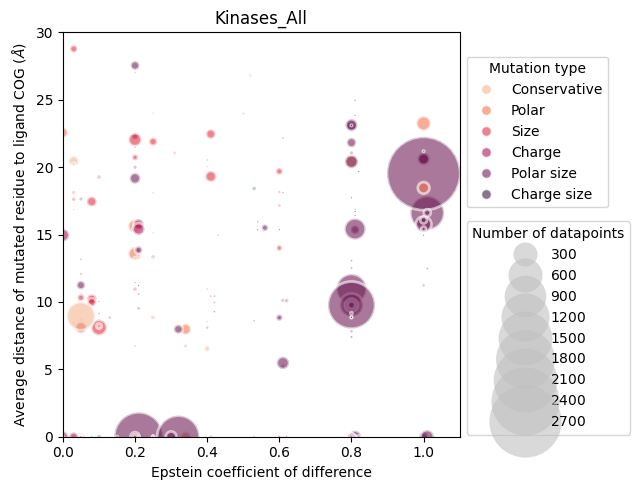

In [16]:
plot_bubble_aachange_distance(annotated_data, kinases_accession_list, 'Kinases_All', dist_dir,
                              output_dir, True, False)

Fetched: 7 / 7
Reading pre-computed results...
{'P51817_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P53667_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'3BLR': {'ligand': 'CPB', 'chain': 'A', 'distance': {'7': 33.57, '8': 31.408, '9': 32.207, '10': 26.973, '11': 27.683, '12': 25.775, '13': 22.093, '14': 21.555, '15': 22.562, '16': 17.256, '17': 20.622, '18': 19.383, '19': 15.925, '20': 18.284, '21': 14.884, '22': 14.724, '23': 11.937, '24': 11.263, '25': 7.111, '26': 7.285, '27': 11.05, '28': 10.985, '29': 12.739, '30': 7.749, '31': 9.776, '32': 10.786, '33': 5.955, '34': 10.204, '35': 10.556, '36': 12.425, '37': 17.936, '38': 19.036, '39': 21.214, '40': 24.394, '41': 21.109, '42': 18.522, '43': 15.991, '44': 13.748, '45': 10.865, '46': 7.459, '47': 9.901, '48': 7.535, '49': 13.028, '50': 14.137, '51': 14.395, '52': 19.07, '53': 18.897, '54': 23.431, '55': 21.985, '56': 27.107, '57': 27.02, '58': 24.291, '59'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



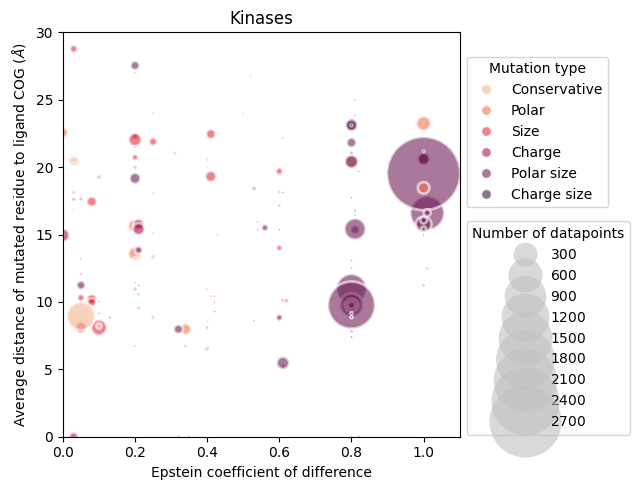

In [17]:
plot_bubble_aachange_distance(annotated_data, kinases_accession_list, 'Kinases', dist_dir,
                              output_dir, True,True)

Retrying in 3s
Fetched: 3 / 3
Reading pre-computed results...
{'Q8HZ64_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P51675_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P33535_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P30994_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'Q9R297_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P35400_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'Q923Y9_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P48145_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P35349_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'Q8TDS5_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P52702_average': {'n_struc

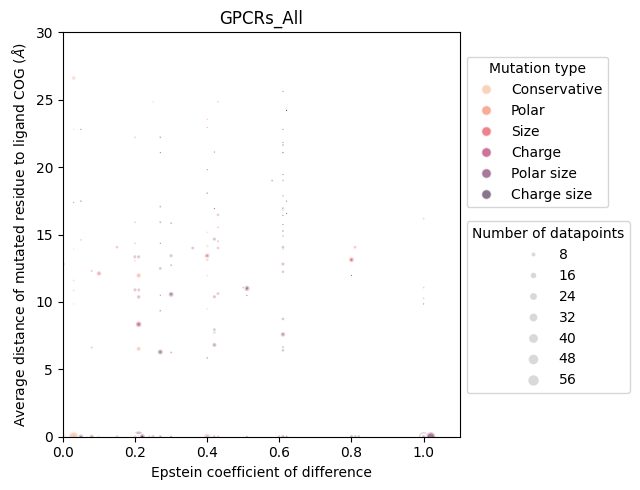

In [18]:
plot_bubble_aachange_distance(annotated_data, gpcrs_accession_list[:872], 'GPCRs_All', dist_dir,
                              output_dir, True,False)

Fetched: 3 / 3
Reading pre-computed results...
{'Q8HZ64_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P51675_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P33535_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P30994_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'Q9R297_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P35400_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'Q923Y9_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P48145_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P35349_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'Q8TDS5_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'P52702_average': {'n_structures': 0, 'dis

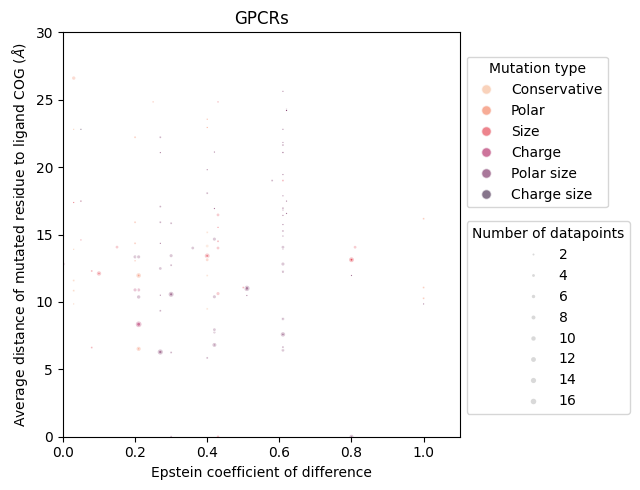

In [19]:
plot_bubble_aachange_distance(annotated_data, gpcrs_accession_list[:872], 'GPCRs', dist_dir,
                              output_dir, True,True)

Reading pre-computed results...
{'1M17': {'ligand': 'AQ4', 'chain': 'A', 'distance': {'672': 36.457, '673': 32.553, '674': 31.168, '675': 30.997, '676': 25.817, '677': 28.573, '678': 23.664, '679': 23.341, '680': 20.822, '681': 20.4, '682': 21.338, '683': 18.391, '684': 22.415, '685': 19.368, '686': 22.128, '687': 20.424, '688': 15.927, '689': 17.796, '690': 13.992, '691': 13.838, '692': 11.135, '693': 10.063, '694': 5.868, '695': 7.906, '696': 11.385, '697': 11.827, '698': 14.183, '699': 10.899, '700': 11.837, '701': 10.164, '702': 5.894, '703': 9.876, '704': 9.019, '705': 11.135, '706': 14.7, '707': 16.522, '708': 19.752, '709': 21.349, '710': 26.402, '711': 26.939, '712': 25.237, '713': 25.421, '714': 21.252, '715': 19.02, '716': 15.227, '717': 12.093, '718': 9.853, '719': 6.812, '720': 9.24, '721': 8.587, '722': 12.721, '723': 14.964, '724': 17.822, '725': 20.588, '726': 21.614, '727': 22.86, '728': 21.695, '729': 24.291, '730': 22.573, '731': 18.906, '732': 20.305, '733': 22.088, 

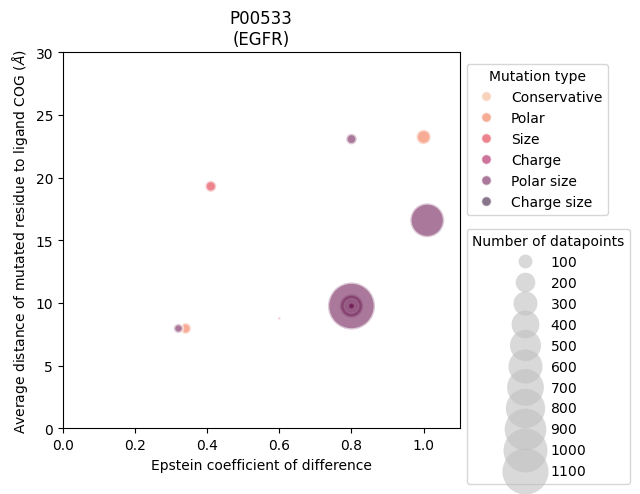

In [20]:
plot_bubble_aachange_distance(annotated_data, ['P00533'], 'EGFR', dist_dir,
                              output_dir, True,True)

Reading pre-computed results...
{'1OPL': {'ligand': 'P16', 'chain': 'A', 'distance': {'81': 44.657, '82': 44.699, '83': 40.053, '84': 39.723, '85': 35.393, '86': 34.088, '87': 31.012, '88': 28.912, '89': 25.03, '90': 25.912, '91': 24.125, '92': 23.862, '93': 25.497, '94': 23.406, '95': 24.745, '96': 28.834, '97': 28.227, '98': 26.629, '99': 29.834, '100': 28.787, '101': 28.912, '102': 30.854, '103': 29.99, '104': 34.117, '105': 34.29, '106': 38.579, '107': 34.916, '108': 39.86, '109': 35.783, '110': 37.32, '111': 34.244, '112': 32.241, '113': 28.428, '114': 27.539, '115': 26.218, '116': 27.977, '117': 23.853, '118': 24.467, '119': 29.919, '120': 33.495, '121': 33.645, '122': 37.805, '123': 36.202, '124': 40.333, '125': 36.151, '126': 36.037, '127': 35.717, '128': 31.492, '129': 29.121, '130': 27.407, '131': 24.53, '132': 27.246, '133': 24.595, '134': 23.85, '135': 29.877, '136': 32.813, '137': 35.801, '138': 38.935, '139': 40.042, '140': 36.795, '141': 36.704, '142': 32.619, '143': 36.

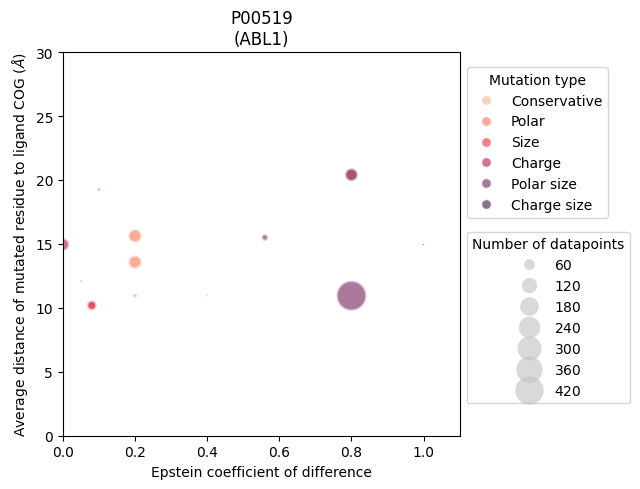

In [21]:
plot_bubble_aachange_distance(annotated_data, ['P00519'], 'ABL1', dist_dir,
                              output_dir, True,True)

In [22]:
# human_accession_list = annotated_data[annotated_data['Organism'] == 'Homo sapiens (Human)']['accession'].unique()\
#     .tolist()
# plot_bubble_aachange_distance(annotated_data, human_accession_list, 'Human_All', dist_dir,
#                               output_dir, True, False)

In [23]:
# plot_bubble_aachange_distance(annotated_data, human_accession_list, 'Human', dist_dir,
#                               output_dir, True, True)

Retrying in 3s
Fetched: 5 / 5
Reading pre-computed results...
{'2JLE': {'ligand': 'I15', 'chain': 'A', 'distance': {'1': 26.398, '2': 28.465, '3': 26.002, '4': 28.065, '5': 26.236, '6': 29.256, '7': 30.737, '8': 29.01, '9': 32.306, '10': 32.799, '11': 36.357, '12': 38.087, '13': 37.371, '14': 40.962, '15': 43.979, '16': 42.02, '17': 43.644, '18': 42.048, '19': 41.058, '20': 45.518, '21': 43.31, '22': 47.229, '23': 44.424, '24': 44.472, '25': 47.968, '26': 44.793, '27': 45.915, '28': 49.063, '29': 44.011, '30': 41.852, '31': 44.53, '32': 44.027, '33': 39.684, '34': 39.172, '35': 41.748, '36': 38.819, '37': 35.521, '38': 37.551, '39': 39.208, '40': 34.828, '41': 33.383, '42': 38.377, '43': 36.549, '44': 32.184, '45': 33.649, '46': 30.877, '47': 35.561, '48': 38.856, '49': 43.24, '50': 44.053, '51': 47.373, '52': 50.287, '53': 50.23, '54': 45.101, '55': 46.765, '56': 43.474, '57': 42.485, '58': 38.736, '59': 39.415, '60': 38.763, '61': 38.014, '62': 37.221, '63': 35.001, '64': 36.339, '65

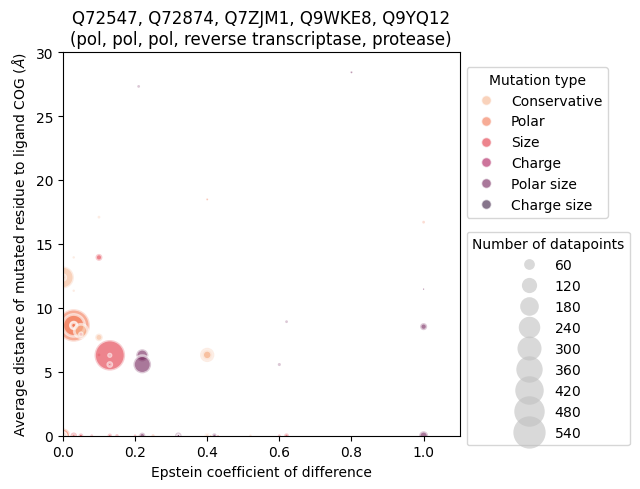

In [24]:
hiv_accession_list = annotated_data[annotated_data['Organism'].str.contains('Human immunodeficiency virus 1', na=False)
]['accession'].unique().tolist()
plot_bubble_aachange_distance(annotated_data, hiv_accession_list, 'HIV_All', dist_dir,output_dir, True, False)

Fetched: 5 / 5
Reading pre-computed results...
{'2JLE': {'ligand': 'I15', 'chain': 'A', 'distance': {'1': 26.398, '2': 28.465, '3': 26.002, '4': 28.065, '5': 26.236, '6': 29.256, '7': 30.737, '8': 29.01, '9': 32.306, '10': 32.799, '11': 36.357, '12': 38.087, '13': 37.371, '14': 40.962, '15': 43.979, '16': 42.02, '17': 43.644, '18': 42.048, '19': 41.058, '20': 45.518, '21': 43.31, '22': 47.229, '23': 44.424, '24': 44.472, '25': 47.968, '26': 44.793, '27': 45.915, '28': 49.063, '29': 44.011, '30': 41.852, '31': 44.53, '32': 44.027, '33': 39.684, '34': 39.172, '35': 41.748, '36': 38.819, '37': 35.521, '38': 37.551, '39': 39.208, '40': 34.828, '41': 33.383, '42': 38.377, '43': 36.549, '44': 32.184, '45': 33.649, '46': 30.877, '47': 35.561, '48': 38.856, '49': 43.24, '50': 44.053, '51': 47.373, '52': 50.287, '53': 50.23, '54': 45.101, '55': 46.765, '56': 43.474, '57': 42.485, '58': 38.736, '59': 39.415, '60': 38.763, '61': 38.014, '62': 37.221, '63': 35.001, '64': 36.339, '65': 35.639, '66'

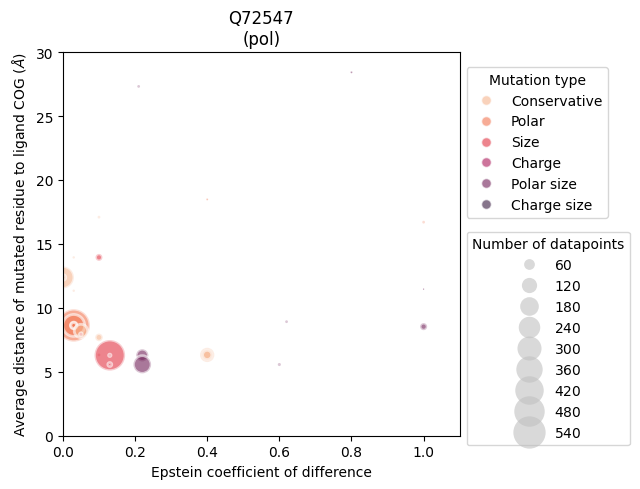

In [25]:
plot_bubble_aachange_distance(annotated_data, hiv_accession_list, 'HIV', dist_dir,
                              output_dir, True, True)

Retrying in 3s
Failed to map 2 ID(s).
Fetched: 23 / 25
Reading pre-computed results...
{'A3EZI9_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'A3EZJ3_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'B4URF0_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'C1KIQ2_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'D5F1R0_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'K7XJL6_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'181L': {'ligand': 'BNZ', 'chain': 'A', 'distance': {'1': 18.488, '2': 17.233, '3': 13.341, '4': 17.138, '5': 19.636, '6': 14.472, '7': 14.768, '8': 21.565, '9': 19.531, '10': 16.546, '11': 17.955, '12': 21.806, '13': 25.407, '14': 27.014, '15': 29.684, '16': 31.714, '17': 29.346, '18': 25.421, '19': 27.305, '20': 21.975, '21': 21.303, '22': 20.953, '23': 24.874, 

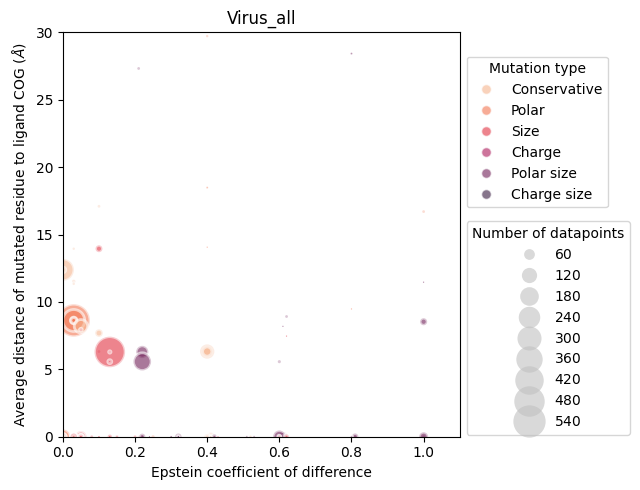

In [26]:
virus_accession_list = annotated_data_tax[annotated_data_tax['classification']=='Virus'].accession.unique()\
    .tolist()
plot_bubble_aachange_distance(annotated_data, virus_accession_list, 'Virus_all', dist_dir,
                              output_dir, True, False)

Failed to map 2 ID(s).
Fetched: 23 / 25
Reading pre-computed results...
{'A3EZI9_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'A3EZJ3_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'B4URF0_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'C1KIQ2_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'D5F1R0_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'K7XJL6_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'181L': {'ligand': 'BNZ', 'chain': 'A', 'distance': {'1': 18.488, '2': 17.233, '3': 13.341, '4': 17.138, '5': 19.636, '6': 14.472, '7': 14.768, '8': 21.565, '9': 19.531, '10': 16.546, '11': 17.955, '12': 21.806, '13': 25.407, '14': 27.014, '15': 29.684, '16': 31.714, '17': 29.346, '18': 25.421, '19': 27.305, '20': 21.975, '21': 21.303, '22': 20.953, '23': 24.874, '24': 22.585, '

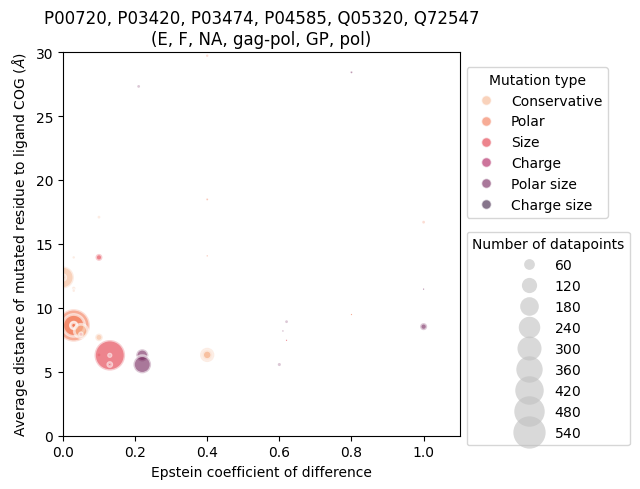

In [27]:
plot_bubble_aachange_distance(annotated_data, virus_accession_list, 'Virus', dist_dir,
                              output_dir, True, True)

Retrying in 3s
Retrying in 3s
Fetched: 28 / 28
Reading pre-computed results...
{'A0A045ISB3_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'4POP': {'ligand': '2VY', 'chain': 'A', 'distance': {'6': 37.93, '7': 34.506, '8': 34.907, '9': 33.807, '10': 29.957, '11': 29.599, '12': 29.807, '13': 28.345, '14': 24.831, '15': 24.705, '16': 25.56, '17': 22.466, '18': 19.712, '19': 20.875, '20': 20.927, '21': 16.753, '22': 16.956, '23': 19.663, '24': 17.305, '25': 13.757, '26': 16.62, '27': 16.71, '28': 15.655, '29': 11.517, '30': 11.67, '31': 13.067, '32': 12.887, '33': 9.327, '34': 4.439, '35': 9.07, '36': 7.998, '37': 12.174, '38': 10.014, '39': 15.116, '40': 14.142, '41': 14.07, '42': 18.04, '43': 19.286, '44': 17.922, '45': 18.704, '46': 23.511, '47': 23.155, '48': 22.489, '49': 24.43, '50': 28.778, '51': 29.016, '52': 25.65, '53': 23.86, '54': 25.25, '55': 24.081, '56': 20.807, '57': 20.186, '58': 21.779, '59': 19.283, '60': 16.403, '61': 17.896, '62': 19

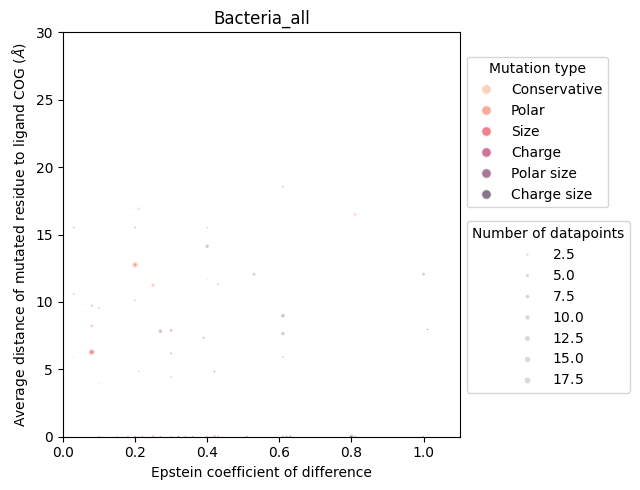

In [28]:
bacteria_accession_list = annotated_data_tax[annotated_data_tax['classification']=='Bacteria'].accession.unique()\
    .tolist()
plot_bubble_aachange_distance(annotated_data, bacteria_accession_list, 'Bacteria_all', dist_dir,
                              output_dir, True, False)

Fetched: 28 / 28
Reading pre-computed results...
{'A0A045ISB3_average': {'n_structures': 0, 'distance': {}}}
{}
Reading pre-computed results...
{'4POP': {'ligand': '2VY', 'chain': 'A', 'distance': {'6': 37.93, '7': 34.506, '8': 34.907, '9': 33.807, '10': 29.957, '11': 29.599, '12': 29.807, '13': 28.345, '14': 24.831, '15': 24.705, '16': 25.56, '17': 22.466, '18': 19.712, '19': 20.875, '20': 20.927, '21': 16.753, '22': 16.956, '23': 19.663, '24': 17.305, '25': 13.757, '26': 16.62, '27': 16.71, '28': 15.655, '29': 11.517, '30': 11.67, '31': 13.067, '32': 12.887, '33': 9.327, '34': 4.439, '35': 9.07, '36': 7.998, '37': 12.174, '38': 10.014, '39': 15.116, '40': 14.142, '41': 14.07, '42': 18.04, '43': 19.286, '44': 17.922, '45': 18.704, '46': 23.511, '47': 23.155, '48': 22.489, '49': 24.43, '50': 28.778, '51': 29.016, '52': 25.65, '53': 23.86, '54': 25.25, '55': 24.081, '56': 20.807, '57': 20.186, '58': 21.779, '59': 19.283, '60': 16.403, '61': 17.896, '62': 19.554, '63': 13.812, '64': 13.9

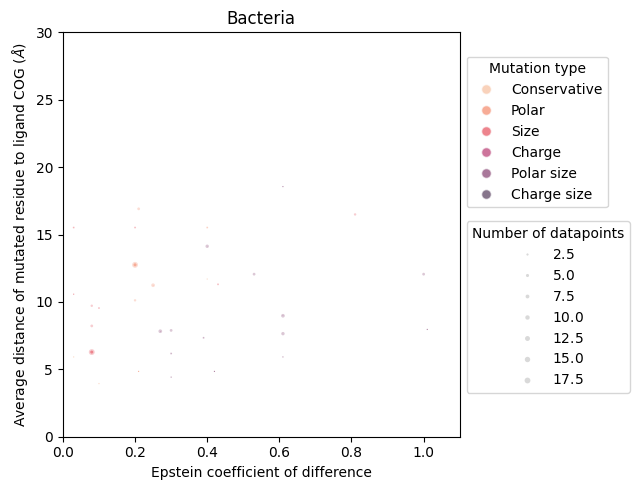

In [29]:
plot_bubble_aachange_distance(annotated_data, bacteria_accession_list, 'Bacteria', dist_dir,
                              output_dir, True, True)

Retrying in 3s
Fetched: 7 / 7
Reading pre-computed results...
{'3IIQ': {'ligand': 'JZA', 'chain': 'A', 'distance': {'79': 26.428, '80': 26.333, '81': 24.947, '82': 19.273, '83': 18.655, '84': 14.409, '85': 12.303, '86': 9.773, '87': 6.989, '88': 4.903, '89': 6.523, '90': 6.295, '91': 10.143, '92': 10.971, '93': 14.839, '94': 14.843, '95': 12.244, '96': 12.804, '97': 10.089, '98': 13.407, '99': 14.081, '100': 16.14, '101': 15.579, '102': 20.166, '103': 18.726, '104': 22.965, '105': 22.303, '106': 22.548, '124': 26.259, '125': 22.366, '126': 24.561, '127': 23.831, '128': 19.702, '129': 19.76, '130': 15.81, '131': 15.301, '132': 14.055, '133': 12.716, '134': 15.049, '135': 10.779, '136': 14.654, '137': 13.971, '138': 12.976, '139': 15.627, '140': 14.874, '141': 10.405, '142': 11.582, '143': 7.744, '144': 9.731, '145': 9.856, '146': 15.447, '147': 17.71, '148': 18.637, '149': 20.55, '150': 23.658, '151': 25.648, '152': 27.573, '153': 25.395, '154': 27.301, '155': 22.402, '156': 23.712, '15

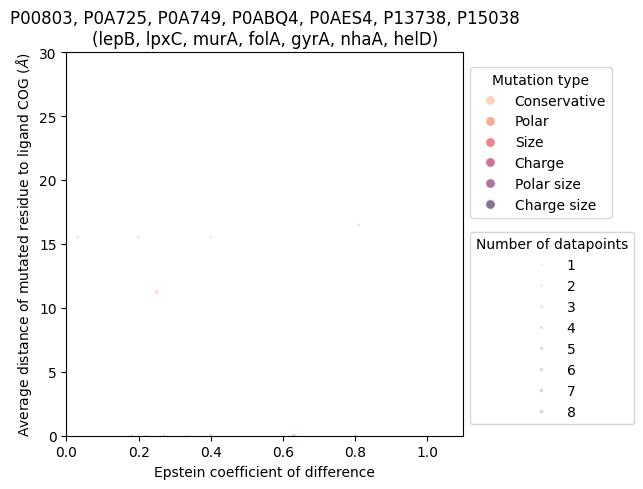

In [30]:
ecoli_accession_list = annotated_data[annotated_data['Organism'] == 'Escherichia coli (strain K12)']['accession']\
    .unique().tolist()
plot_bubble_aachange_distance(annotated_data, ecoli_accession_list, 'EColi_All', dist_dir,
                              output_dir, True, False)

Fetched: 7 / 7
Reading pre-computed results...
{'3IIQ': {'ligand': 'JZA', 'chain': 'A', 'distance': {'79': 26.428, '80': 26.333, '81': 24.947, '82': 19.273, '83': 18.655, '84': 14.409, '85': 12.303, '86': 9.773, '87': 6.989, '88': 4.903, '89': 6.523, '90': 6.295, '91': 10.143, '92': 10.971, '93': 14.839, '94': 14.843, '95': 12.244, '96': 12.804, '97': 10.089, '98': 13.407, '99': 14.081, '100': 16.14, '101': 15.579, '102': 20.166, '103': 18.726, '104': 22.965, '105': 22.303, '106': 22.548, '124': 26.259, '125': 22.366, '126': 24.561, '127': 23.831, '128': 19.702, '129': 19.76, '130': 15.81, '131': 15.301, '132': 14.055, '133': 12.716, '134': 15.049, '135': 10.779, '136': 14.654, '137': 13.971, '138': 12.976, '139': 15.627, '140': 14.874, '141': 10.405, '142': 11.582, '143': 7.744, '144': 9.731, '145': 9.856, '146': 15.447, '147': 17.71, '148': 18.637, '149': 20.55, '150': 23.658, '151': 25.648, '152': 27.573, '153': 25.395, '154': 27.301, '155': 22.402, '156': 23.712, '157': 18.9, '158'

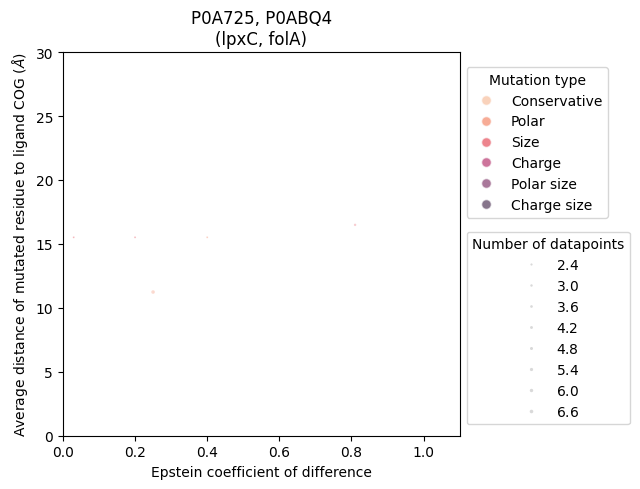

In [31]:
plot_bubble_aachange_distance(annotated_data, ecoli_accession_list, 'EColi', dist_dir,
                              output_dir, True, True)

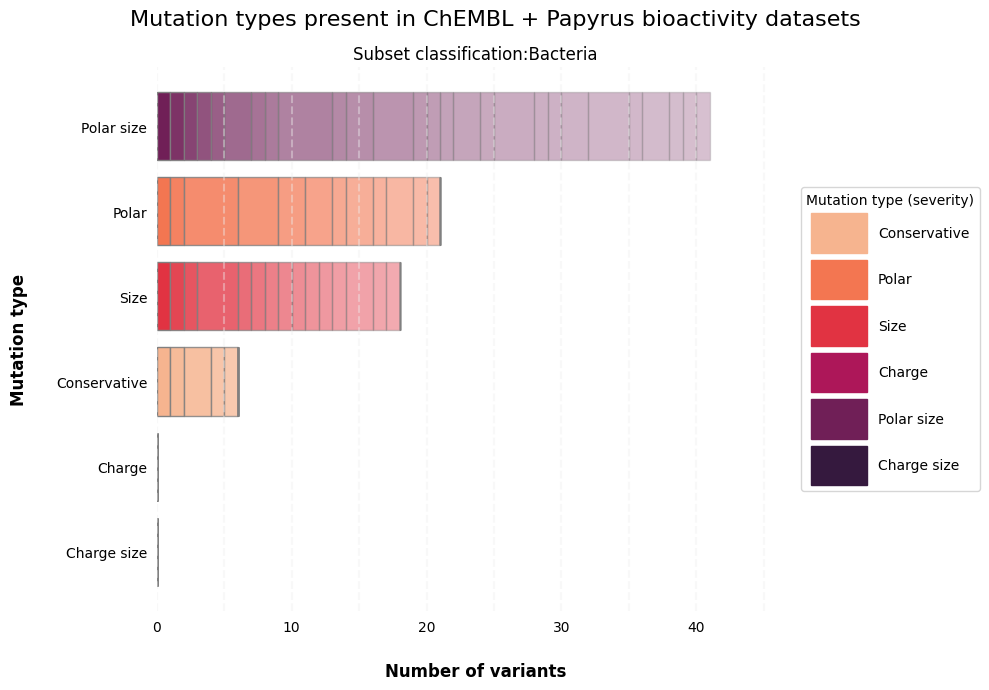

In [32]:
plot_stacked_bars_mutation_type(annotated_data_tax, os.path
                                .join(output_dir, 'organism'),
                                True, 'variant', 'mutation_type', 'classification', 'Bacteria', False)

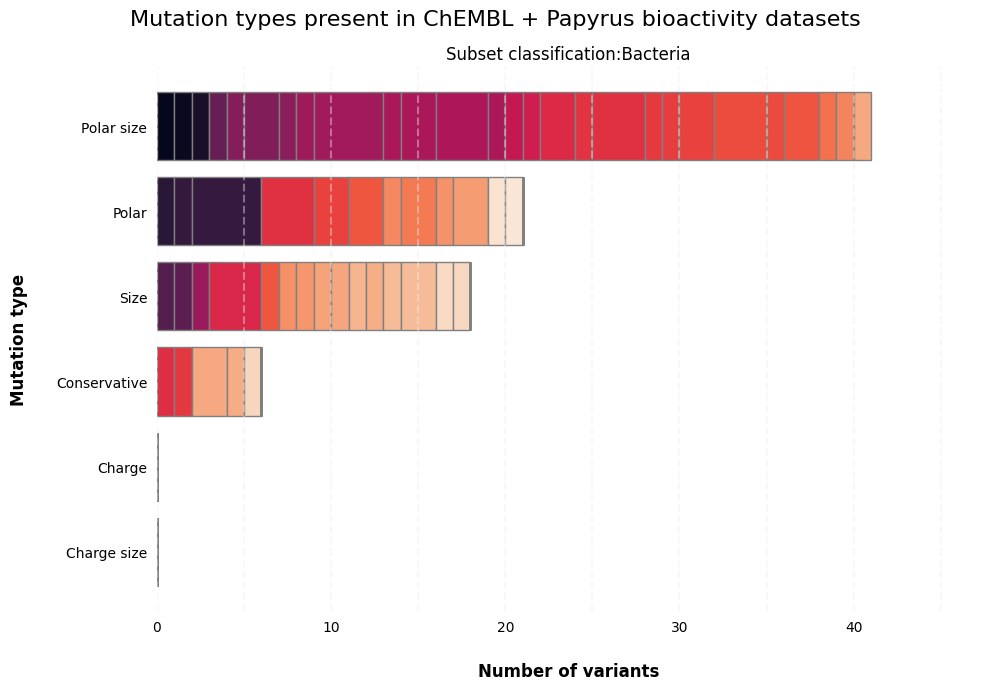

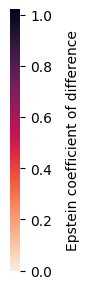

In [33]:
plot_stacked_bars_mutation_type(annotated_data_tax, os.path
                                .join(output_dir, 'organism'),
                                True, 'variant', 'distance_matrix', 'classification', 'Bacteria', False)

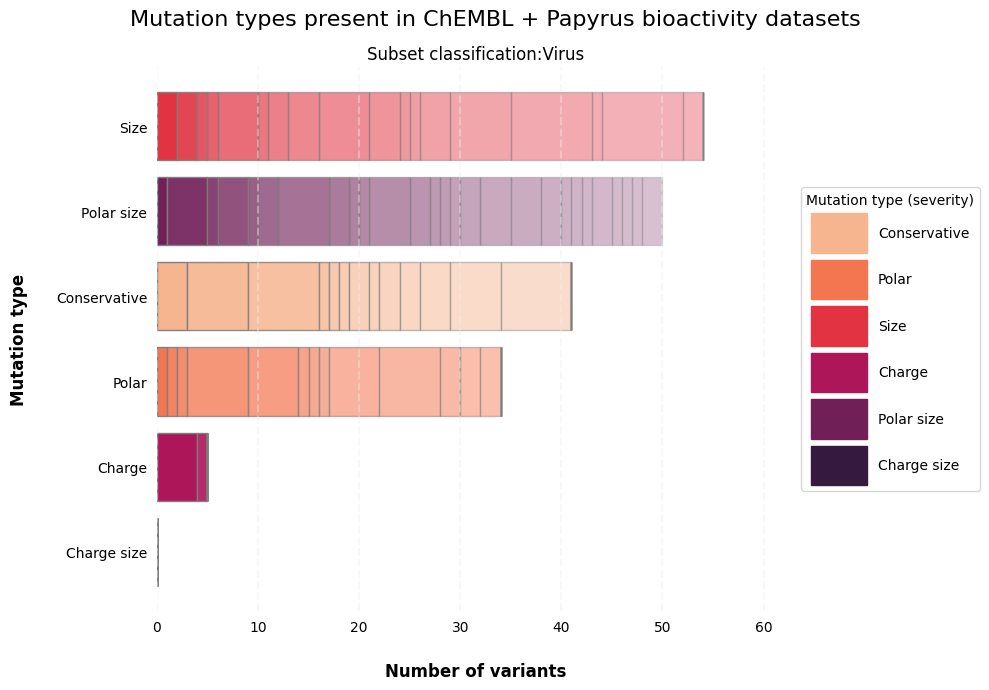

In [34]:
plot_stacked_bars_mutation_type(annotated_data_tax, os.path
                                .join(output_dir, 'organism'),
                                True, 'variant', 'mutation_type', 'classification', 'Virus', False)

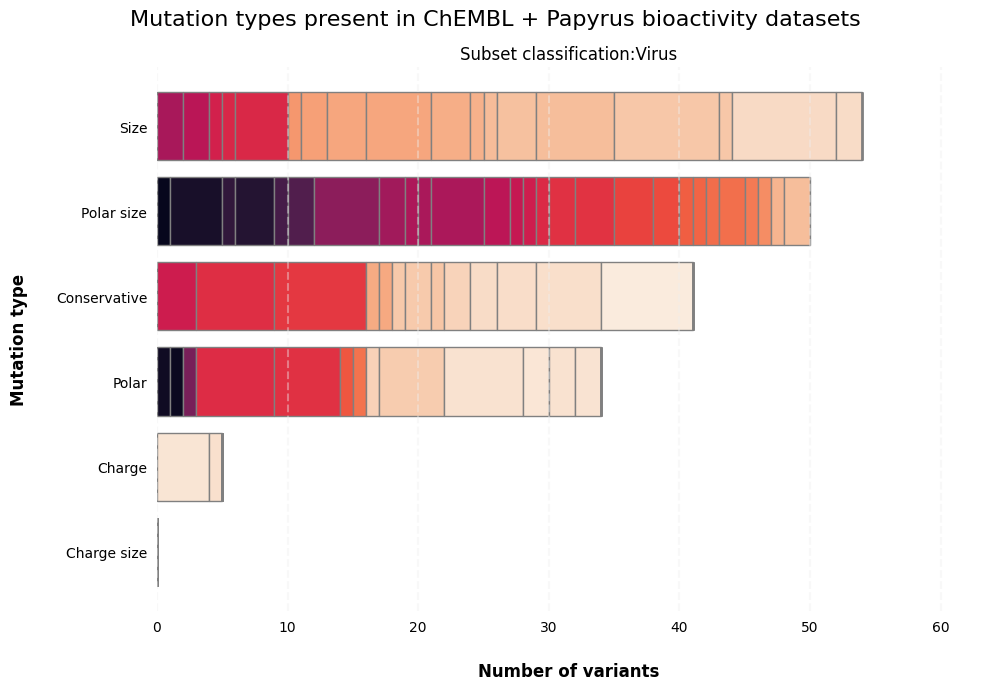

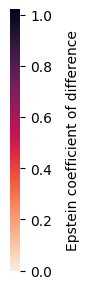

In [35]:
plot_stacked_bars_mutation_type(annotated_data_tax, os.path
                                .join(output_dir, 'organism'),
                                True, 'variant', 'distance_matrix', 'classification', 'Virus', False)

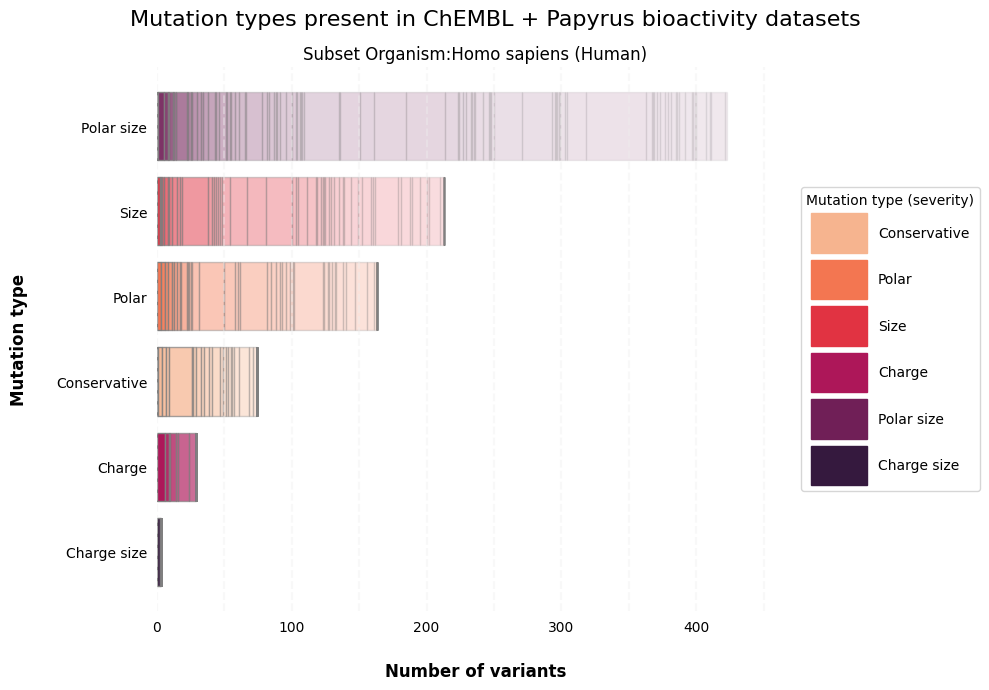

In [36]:
plot_stacked_bars_mutation_type(annotated_data_tax, os.path
                                .join(output_dir, 'organism'),
                                True, 'variant', 'mutation_type', 'Organism', 'Homo sapiens (Human)', False)

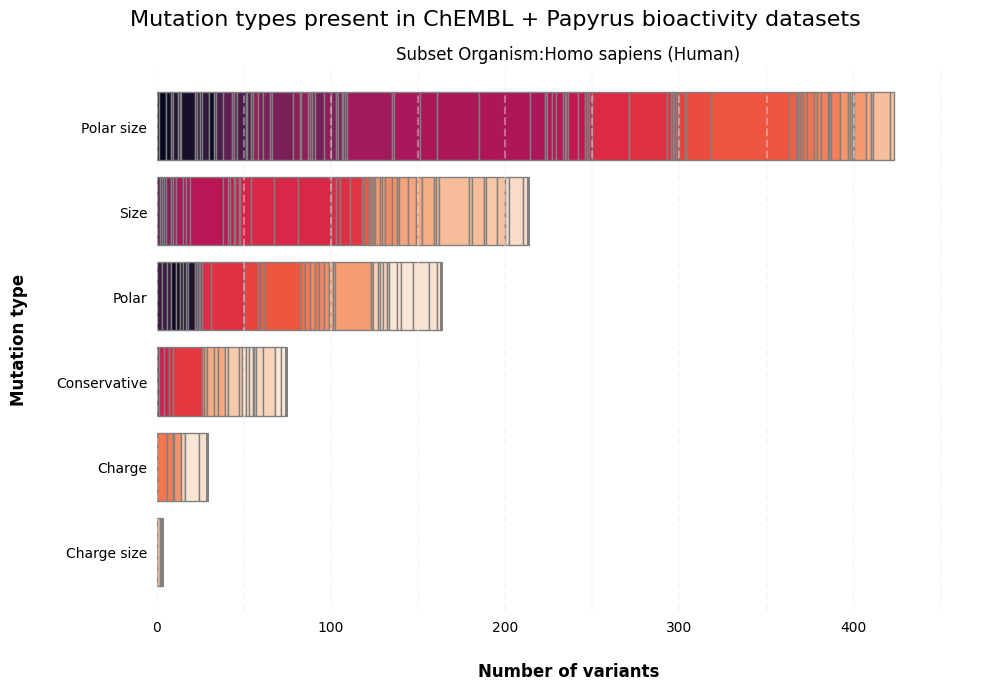

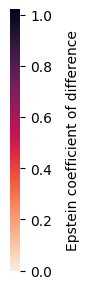

In [37]:
plot_stacked_bars_mutation_type(annotated_data_tax, os.path
                                .join(output_dir, 'organism'),
                                True, 'variant', 'distance_matrix', 'Organism', 'Homo sapiens (Human)', False)